In [1]:
# General
import pandas as pd
import numpy as np
from math import sqrt

# Dimension reduction
from sklearn.decomposition import PCA

# Machine learning
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.dummy import DummyRegressor
from sklearn.metrics import precision_recall_fscore_support, f1_score, mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import SGDRegressor, LinearRegression
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

# Vizu
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Tracking
import mlflow
import mlflow.sklearn

In [ ]:
df = pd.read_csv('/home/anaconda/workspace/dataset_3.csv')
del df['Type Essence']
del df['Genre Navigation']
del df['ID Nav Flotteur']
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)
df = pd.DataFrame(scaled_df, columns=df.columns)

In [3]:
df

,Annee,At,At Cible,Prescriptions,Prescriptions Majeurs,Sitrep,Sitrep Cible
0,1.467765,-0.131952,-0.118877,3.548580,0.728606,-0.264429,-0.204901
1,1.467765,-0.131952,-0.118877,0.285034,-0.320885,-0.264429,-0.204901
2,1.467765,-0.131952,-0.118877,0.051924,-0.320885,-0.264429,-0.204901
3,1.467765,-0.131952,-0.118877,1.217476,0.728606,-0.264429,-0.204901
4,1.467765,-0.131952,-0.118877,0.751255,1.778096,-0.264429,-0.204901
...,...,...,...,...,...,...,...
55880,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901
55881,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901
55882,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901
55883,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901


## Vue globale

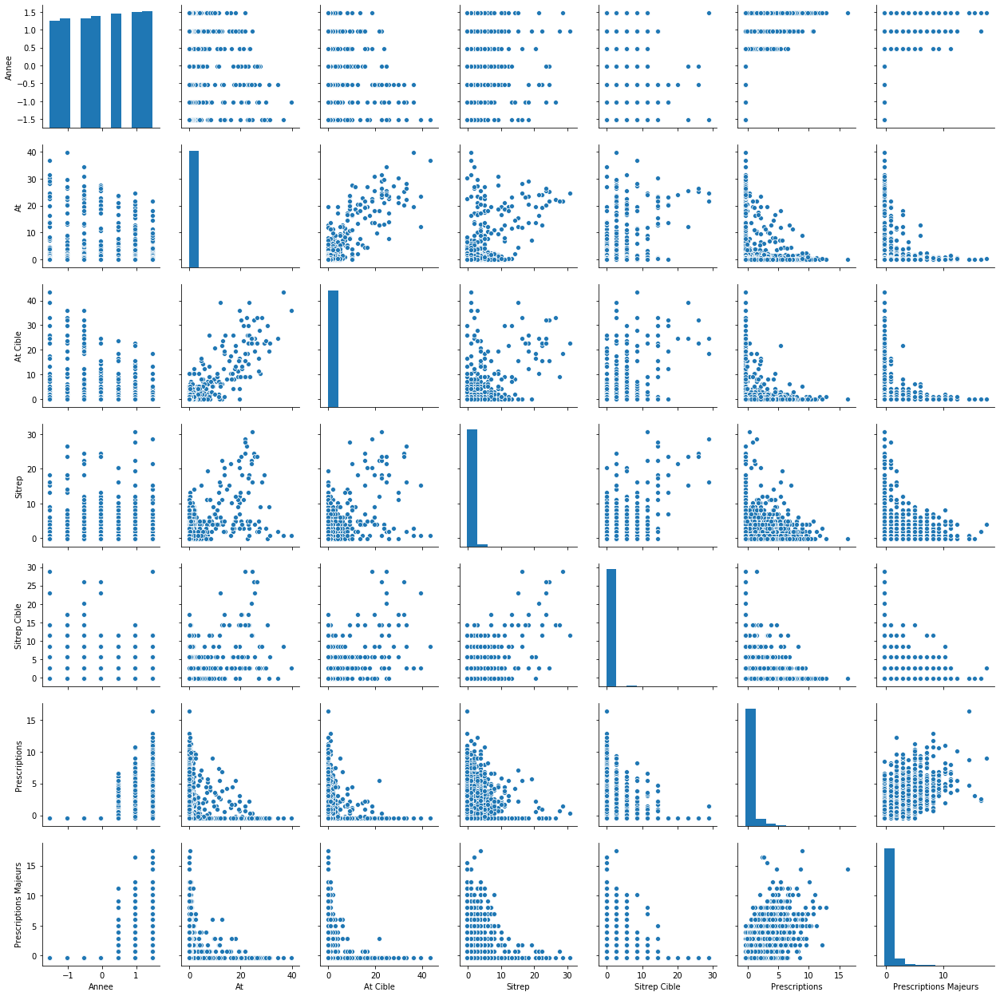

In [122]:
#sns.pairplot(data=df[['Annee', 'At', 'Sitrep', 'Genre Navigation', 'Prescriptions', 'Prescriptions Majeurs']].sample(frac=0.2))
sns.pairplot(data=df[['Annee', 'At', 'At Cible', 'Sitrep', 'Sitrep Cible', 'Prescriptions', 'Prescriptions Majeurs']].sample(frac=0.8))

## Etude sur les corrélation entre éléments

In [123]:
df.corr('pearson')

,Annee,At,At Cible,Prescriptions,Prescriptions Majeurs,Sitrep,Sitrep Cible
Annee,1.000000,-0.026001,-0.048280,0.470627,0.364325,0.027916,-0.003590
At,-0.026001,1.000000,0.850658,0.040940,0.024335,0.513289,0.390041
At Cible,-0.048280,0.850658,1.000000,0.007611,0.004051,0.451927,0.397802
Prescriptions,0.470627,0.040940,0.007611,1.000000,0.721316,0.168664,0.090594
Prescriptions Majeurs,0.364325,0.024335,0.004051,0.721316,1.000000,0.159332,0.087353
Sitrep,0.027916,0.513289,0.451927,0.168664,0.159332,1.000000,0.493243
Sitrep Cible,-0.003590,0.390041,0.397802,0.090594,0.087353,0.493243,1.000000


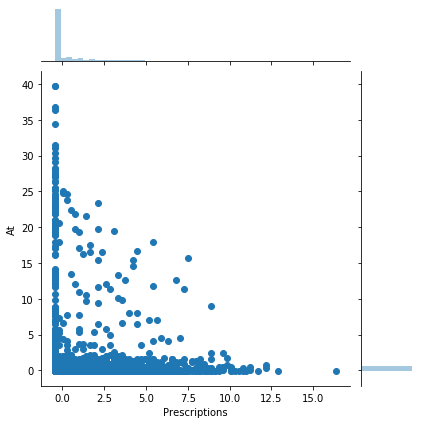

In [124]:
sns.jointplot(x="Prescriptions", y="At", data=df);

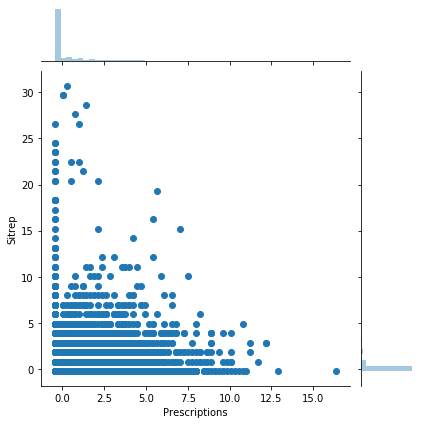

In [125]:
sns.jointplot(x="Prescriptions", y="Sitrep", data=df);

Et maintenant le paramètre ayant la meilleure corrélation avec le nombre de Sitrep : l'AT

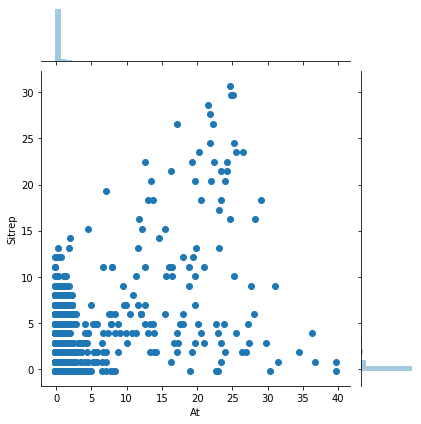

In [126]:
sns.jointplot(x="At", y="Sitrep", data=df);

## Réduction de dimensionalité

In [4]:
pca = PCA(n_components=2)

#pca = pca.fit_transform(df.dropna()[['Annee', 'At', 'Genre Navigation', 'Prescriptions', 'Prescriptions Majeurs']], )
pca = pca.fit_transform(df.dropna()[['Annee', 'At',  'Prescriptions', 'Prescriptions Majeurs', 'Sitrep']], )

df_pca = pd.DataFrame(pca, columns=['x1', 'x2'])
df_pca = df_pca.join(df)

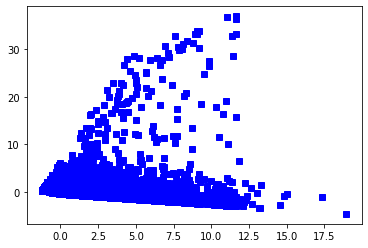

In [5]:
plt.plot(df_pca.x1, df_pca.x2, 'bs')

Nous pouvons voir plusieurs groupes. Essayons de voir comment se placent les Sitrep dedans

In [35]:
def classification_sitrep(sitrep):
    if sitrep <= 1.6:
        return 'green'
    elif 1.6 < sitrep :
        return 'red'
    else:
        return 'red'


In [42]:
sns.dist(df['Sitrep Cible'])

AttributeError: module 'seaborn' has no attribute 'dist'

In [39]:
df_pca['sitrep_categories'] = df['Sitrep Cible'].apply(lambda x: classification_sitrep(x))

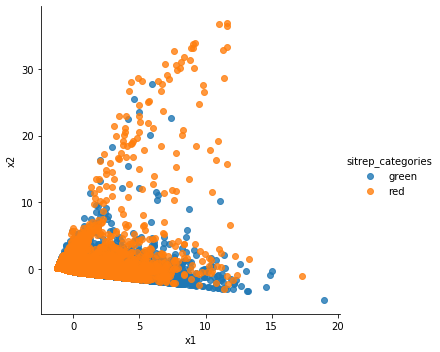

In [37]:
sns.lmplot('x1', 'x2', data=df_pca, hue='sitrep_categories', fit_reg=False)

plt.show()

Il est difficle de séparer le jeu de données en fontion des SITREP. Nous avons tout de même l'impression qu'il y a plus d'accident quand un point est proche du plan quasi horizontal. Essayons en 3 dimension

In [7]:
pca = PCA(n_components=3)

pca = pca.fit_transform(df.dropna()[['Annee', 'At', 'Prescriptions', 'Prescriptions Majeurs', 'Sitrep']], )
df_pca = pd.DataFrame(pca, columns=['x1', 'x2', 'x3'])
df_pca['sitrep_categories'] = df['Sitrep Cible'].apply(lambda x: classification_sitrep(x))
df_pca = df_pca.join(df)
df_pca

,x1,x2,x3,sitrep_categories,Annee,At,At Cible,Prescriptions,Prescriptions Majeurs,Sitrep,Sitrep Cible
0,3.170805,-1.176910,-0.114559,green,1.467765,-0.131952,-0.118877,3.548580,0.728606,-0.264429,-0.204901
1,0.565006,-0.602379,-1.303930,green,1.467765,-0.131952,-0.118877,0.285034,-0.320885,-0.264429,-0.204901
2,0.422540,-0.570993,-1.354988,green,1.467765,-0.131952,-0.118877,0.051924,-0.320885,-0.264429,-0.204901
3,1.746141,-0.863053,-0.625143,green,1.467765,-0.131952,-0.118877,1.217476,0.728606,-0.264429,-0.204901
4,2.072477,-0.935412,-0.252708,green,1.467765,-0.131952,-0.118877,0.751255,1.778096,-0.264429,-0.204901
...,...,...,...,...,...,...,...,...,...,...,...
55880,-1.216825,0.188681,1.068298,green,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901
55881,-1.216825,0.188681,1.068298,green,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901
55882,-1.216825,0.188681,1.068298,green,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901
55883,-1.216825,0.188681,1.068298,green,-1.531195,-0.131952,-0.118877,-0.414297,-0.320885,-0.264429,-0.204901


In [8]:
import plotly.graph_objects as go
import numpy as np

# Helix equation
t = np.linspace(0, 20, 100)
x, y, z = np.cos(t), np.sin(t), t

fig = go.Figure(data=[go.Scatter3d(
    x=df_pca['x1'],
    y=df_pca['x2'],
    z=df_pca['x3'],
    mode='markers',
    marker=dict(
        size=2,
        color=df_pca['sitrep_categories'],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

/home/anaconda/anaconda3/lib/python3.7/site-packages/nbformat/notebooknode.py:4: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working

